# MyMidjourney API
copyright 2024, Denis Rothman

Implementing the [Midjourney API](https://www.mymidjourney.ai/) to generate images.

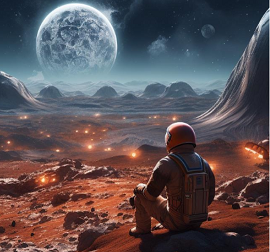





This notebook implements an original generation of several variations with the Midjourney API with a prompt and a function to select one of the variations generated.

**Table of Contents**

1.Your API Token <br>
2.Generating an image with a prompt<br>
You can automate the prompt as shown in
[Automated_ideation.ipynb](https://colab.research.google.com/github/Denis2054/Transformers-for-NLP-and-Computer-Vision-3rd-Edition/blob/main/Chapter20/Automated_Ideation.ipynb) <br>
3.Monitoring the job progress <br>
You can introduce a timer here to overcome the waiting times
issues.<br>
4.Displaying the 8 variations of the image <br>
5.Selecting an image <br>

**Release note** <br>
Depending on your project, you can modify this notebook as you wish.<br>
First, run the notebook cell by cell due to the waiting times once you have requested a job. <br>
Then, you can modify any function. For example, you can add a timer at phase *3. Monitoring the job progress.* You can also add a loop to check when the job reaches the `DONE` status. Your imagination is the limit!

# 1.Your API token

To obtain an [Midjourney API token](https://www.mymidjourney.ai/), you must go through a subscription process.

*Before creating and account and subscribing, make sure to check the cost of the Midjourney service.*

Follow the instructions to set up your account and obtain an API Key.

In [1]:
#Midjourney API token
#Store you key in a file and read it(you can type it directly in the notebook but it will be visible for somebody next to you)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
f = open("drive/MyDrive/files/mjkey.txt", "r")
api_token=f.readline()
f.close()

# 2.Generating an image

Make sure requests, an HTTP library, is installed.

In [3]:
!pip install requests

In [4]:
import requests

# Construct headers with appropriate Bearer token authorization
headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {api_token}"  # Using f-string for safe key insertion
}

# Define request body with the prompt
data = {
    "prompt": "An 17th century ship sailing in space on stars and galaxies"
}

# Send the POST request to the Midjourney API endpoint
try:
    response = requests.post(
        url="https://api.mymidjourney.ai/api/v1/midjourney/imagine",
        headers=headers,
        json=data
    )
    response.raise_for_status()  # Raise an exception for non-200 status codes

    # Print the JSON-formatted response data for debugging or further processing
    print(response.json())

except requests.exceptions.RequestException as e:
    print(f"An error occurred: {e}")


{'success': True, 'messageId': '7dd30d49-1e50-45d7-a7f2-875d551eb112', 'createdAt': '2024-03-29T10:23:03+00:00'}


## Displaying the response

In [5]:
print(response.json())

{'success': True, 'messageId': '7dd30d49-1e50-45d7-a7f2-875d551eb112', 'createdAt': '2024-03-29T10:23:03+00:00'}


## Extracting the message ID

In [6]:
response=response.json()
message_id = response.get('messageId')

In [7]:
# Check if the messageId is extracted successfully
if message_id:
    print(f"Extracted message ID: {message_id}")
else:
    print("Message ID not found in the response.")

Extracted message ID: 7dd30d49-1e50-45d7-a7f2-875d551eb112


# 3. Monitoring the job progress

## Job status

You may have to wait for the job to be processed.

Your job may be queud. In that case the status will be `QUEUD`

In that case, the status will be `PROGRESSING`

Once the job is done, the status will be `DONE` and then you can access your image.

Note: You might want to introduce a timer of n seconds if you with to automate the full process. Or you could add a loop to detect when the job is `DONE`.

In [8]:
import requests

url = f"https://api.mymidjourney.ai/api/v1/midjourney/message/{message_id}"
headers = {
    "Authorization": f"Bearer {api_token}",
}

try:
    response = requests.get(url, headers=headers)
    response.raise_for_status()  # Raises an error for non-200 status codes
    response_data = response.json()

    # The specific key for status might vary; this is a generic placeholder
    if 'status' in response_data:
        print(f"Job status: {response_data['status']}")
    else:
        print("Status information not available in the response.")
        print(response_data)
except requests.exceptions.RequestException as error:
    print(error)


Job status: DONE


## Retrieving the Job's Message ID

We can now retrieve the job's message ID, extract the path to the image

NOTE: THERE CAN BE A TIME LAPSE BETWEEN THE END OF JOB AND THE AVAILABILITY OF THE IMAGE.

In [18]:
import requests

url = f"https://api.mymidjourney.ai/api/v1/midjourney/message/{message_id}"
headers = {
    "Authorization": f"Bearer {api_token}",
}

try:
    response = requests.get(url, headers=headers)
    response.raise_for_status()  # This will raise an error for non-200 status codes
    print(response.json())  # Print the response data in JSON format
except requests.exceptions.RequestException as error:
    print(error)

{'prompt': 'An 17th century ship sailing in space on stars and galaxies', 'status': 'DONE', 'uri': 'https://cdn.discordapp.com/attachments/1223135444926074883/1223215911931220029/gildon63chapoy6_An_17th_century_ship_sailing_in_space_on_stars__9bc1930b-cb34-4784-9d86-27348fa8ccaf.png?ex=66190b97&is=66069697&hm=745785e8d2dd831f8dbf12df9afd232dc639990597a7f01ff5db066e47b46e92&width=1024&height=1024', 'progress': 100, 'buttons': ['U1', 'U2', 'U3', 'U4', '🔄', 'V1', 'V2', 'V3', 'V4'], 'messageId': '7dd30d49-1e50-45d7-a7f2-875d551eb112', 'createdAt': '2024-03-29T10:23:03+00:00', 'updatedAt': '2024-03-29T10:23:20+00:00'}


In [19]:
response_data=response.json()
image_url = response_data['uri']

# Display the image URL
print(f"Image URL: {image_url}")


Image URL: https://cdn.discordapp.com/attachments/1223135444926074883/1223215911931220029/gildon63chapoy6_An_17th_century_ship_sailing_in_space_on_stars__9bc1930b-cb34-4784-9d86-27348fa8ccaf.png?ex=66190b97&is=66069697&hm=745785e8d2dd831f8dbf12df9afd232dc639990597a7f01ff5db066e47b46e92&width=1024&height=1024


## Downloading the image

Once you download the image, you can then save it in Google Drive or in any other location.

In [20]:
import requests

response = requests.get(image_url)

if response.status_code == 200:
    with open("downloaded_image.png", "wb") as file:
        file.write(response.content)
    print("Image downloaded successfully.")
else:
    print("Failed to download the image.")


Image downloaded successfully.


# 4.Displaying the images

## Displaying the full image

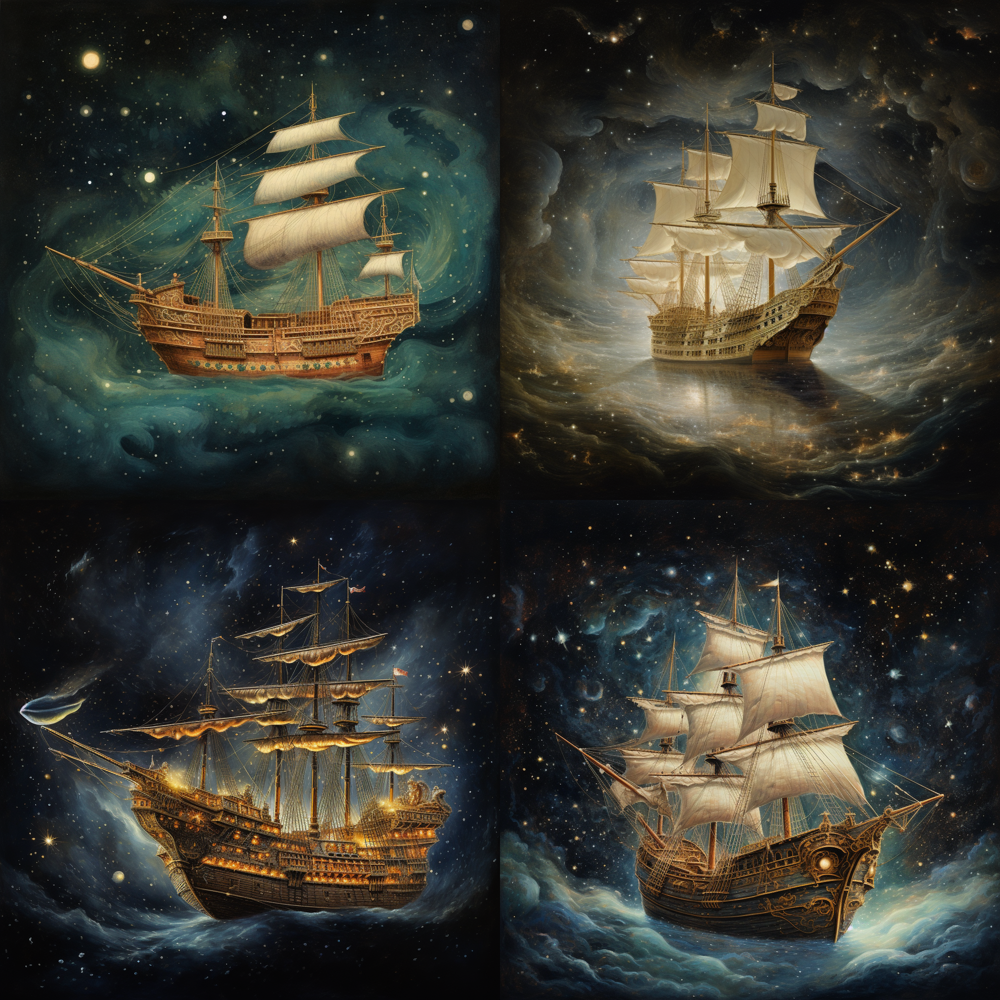

In [21]:
from IPython.display import Image, display

# Provide the path to the image file
image_path = 'downloaded_image.png'

# Display the image
display(Image(filename=image_path))

# 5.Selecting an image

Midjourney displays several versions of an image.

We can choose one of the buttons:

'buttons': ['U1', 'U2', 'U3', 'U4', '🔄', 'V1', 'V2', 'V3', 'V4']

The following code first implements a `button_choice` and includes it in the prompta `data`.

Then the same code sections 2 to 4 of this notebook are applied to display the image we extracted from the 8 variations provided by the API.

In [22]:
import requests
from IPython.display import Image, display

button_choice = "U1"  # The button you want to interact with

url = "https://api.mymidjourney.ai/api/v1/midjourney/button"
headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {api_token}",
}
data = {
    "messageId": message_id,
    "button": button_choice,
}

try:
    response = requests.post(url, headers=headers, json=data)
    response.raise_for_status()  # This will raise an error for non-200 status codes
    print(response.json())  # Print the response data in JSON format
except requests.exceptions.RequestException as error:
    print(error)


{'success': True, 'messageId': '768c7461-f7ec-4290-b808-1e1a072be27f', 'createdAt': '2024-03-29T10:35:24+00:00'}


In [23]:
responsed=response.json()
message_id = responsed.get('messageId')
# Check if the messageId is extracted successfully
if message_id:
  print(f"Extracted message ID: {message_id}")
else:
  print("Message ID not found in the response.")

Extracted message ID: 768c7461-f7ec-4290-b808-1e1a072be27f


## Job status

You may have to wait for the job to be processed.

Your job may be queud. In that case the status will be `QUEUD`

In that case, the status will be `PROGRESSING`

Once the job is done, the status will be `DONE` and then you can access your image.

Note: You might want to introduce a timer of n seconds if you with to automate the full process.

In [24]:
import requests

url = f"https://api.mymidjourney.ai/api/v1/midjourney/message/{message_id}"
headers = {
    "Authorization": f"Bearer {api_token}",
}

try:
    response = requests.get(url, headers=headers)
    response.raise_for_status()  # Raises an error for non-200 status codes
    response_data = response.json()

    # The specific key for status might vary; this is a generic placeholder
    if 'status' in response_data:
        print(f"Job status: {response_data['status']}")
    else:
        print("Status information not available in the response.")
        print(response_data)
except requests.exceptions.RequestException as error:
    print(error)


Job status: DONE


## Retrieving the job's message ID

In [25]:
import requests

url = f"https://api.mymidjourney.ai/api/v1/midjourney/message/{message_id}"
headers = {
    "Authorization": f"Bearer {api_token}",
}

try:
    response = requests.get(url, headers=headers)
    response.raise_for_status()  # This will raise an error for non-200 status codes
    print(response.json())  # Print the response data in JSON format
except requests.exceptions.RequestException as error:
    print(error)

{'prompt': 'An 17th century ship sailing in space on stars and galaxies', 'originatingMessageId': '7dd30d49-1e50-45d7-a7f2-875d551eb112', 'status': 'DONE', 'uri': 'https://cdn.discordapp.com/attachments/1223135444926074883/1223218961865379870/gildon63chapoy6_An_17th_century_ship_sailing_in_space_on_stars__36bcf714-517f-4c29-9c74-a1bac32bd8f0.png?ex=66190e6e&is=6606996e&hm=c8a36ff5dec6f1cea469cf3f824231855b521b7fb85856166a7610138e321c27&width=512&height=512', 'progress': 100, 'buttons': ['Upscale (2x)', 'Upscale (4x)', 'Vary (Subtle)', 'Vary (Strong)', 'Zoom Out 2x', 'Zoom Out 1.5x', '⬅️', '➡️', '⬆️', '⬇️'], 'messageId': '768c7461-f7ec-4290-b808-1e1a072be27f', 'createdAt': '2024-03-29T10:35:24+00:00', 'updatedAt': '2024-03-29T10:35:27+00:00'}


## Displaying the url

In [26]:
response_data=response.json()
image_url = response_data['uri']

# Display the image URL
print(f"Image URL: {image_url}")


Image URL: https://cdn.discordapp.com/attachments/1223135444926074883/1223218961865379870/gildon63chapoy6_An_17th_century_ship_sailing_in_space_on_stars__36bcf714-517f-4c29-9c74-a1bac32bd8f0.png?ex=66190e6e&is=6606996e&hm=c8a36ff5dec6f1cea469cf3f824231855b521b7fb85856166a7610138e321c27&width=512&height=512


## Downloading the image

Once you download the image, you can then save it in Google Drive or in any other location.

In [27]:
import requests

response = requests.get(image_url)

if response.status_code == 200:
    with open("downloaded_image_1.png", "wb") as file:
        file.write(response.content)
    print("Image downloaded successfully.")
else:
    print("Failed to download the image.")


Image downloaded successfully.


## Displaying the image

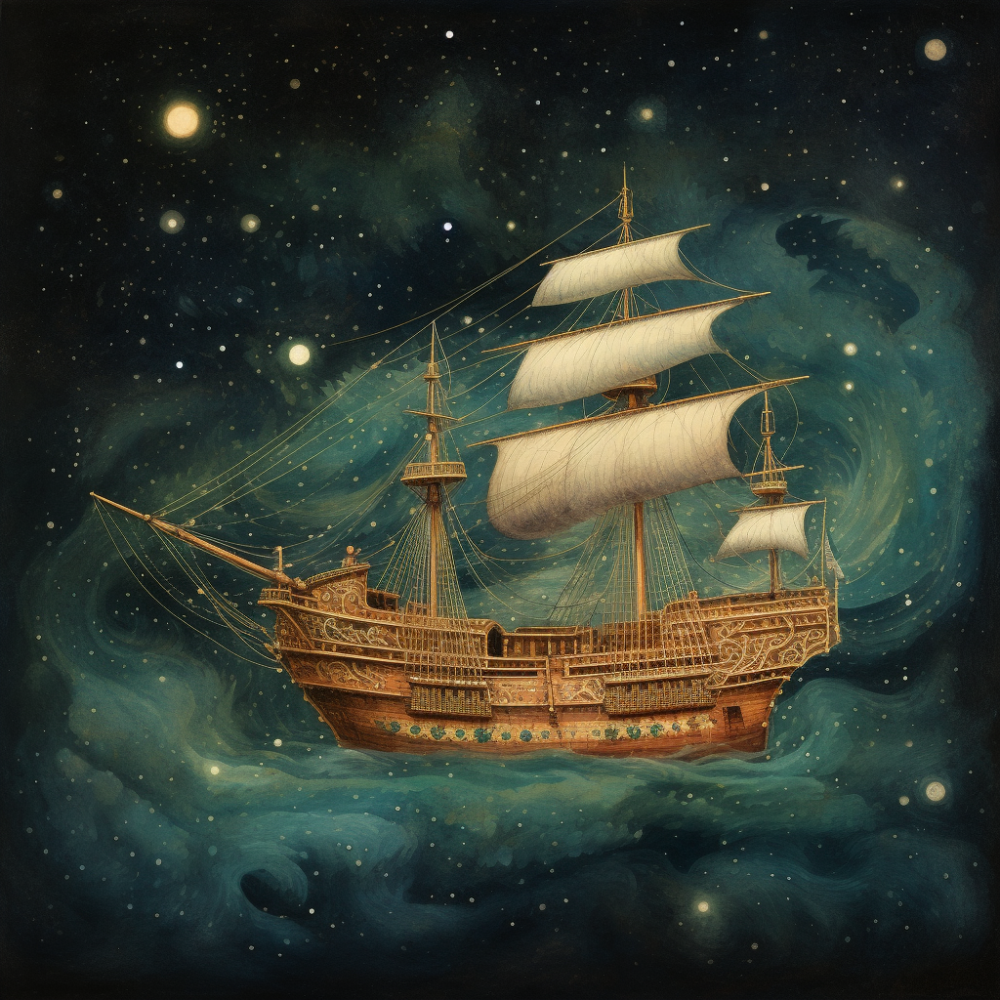

In [28]:
from IPython.display import Image, display

# Provide the path to the image file
image_path = 'downloaded_image_1.png'

# Display the image
display(Image(filename=image_path))